In [2]:
%pylab inline
import gc
import os
import detect3D
import astropy.io.fits as pyfits
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

import haloSim
import massmap_utilities as mapUtil
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

configName  =   'wrkDir/config-nl20.ini'
parser      =   ConfigParser()
parser.read(configName)
catDir=   'wrkDir/reGaus_catalog/'
matDir=   'wrkDir/reGaus_catalog_mock/'
pixDir=   'wrkDir/pixel/'
mixDir=   'wrkDir/pixel_mock/'
mapDir=   'wrkDir/massmap/'
fieldname='XMM'
nsim=200

Populating the interactive namespace from numpy and matplotlib


In [3]:
cat=pyfits.getdata(os.path.join(catDir,'%s.fits' %fieldname))
print(np.min(cat['ra']),np.min(cat['dec']))
print(np.max(cat['ra']),np.max(cat['dec']))
raMin=31.;raMax=34.
decMin=-5.5;decMax=-2.5
mask=(cat['ra']>raMin)&(cat['ra']<raMax)
mask&=(cat['dec']>decMin)&(cat['dec']<decMax)
cat=cat[mask]
pyfits.writeto(os.path.join(catDir,'%s.fits' %(fieldname+'-cut')),cat,overwrite=True)
print(np.min(cat['ra']),np.min(cat['dec']))
print(np.max(cat['ra']),np.max(cat['dec']))

29.093784804406443 -6.390883093002129
39.41687484206933 -1.1945190640719054
31.000011438689402 -5.499996937195547
33.99999863800415 -2.5000130029999865


In [4]:
if False:
    nobj=len(cat)
    for i in range(nsim):
        catMock   =   cat.copy()
        np.random.seed(i)
        phi = 2.0 * np.pi * np.random.rand(nobj)
        g1n,g2n   =   mapUtil.rotCatalog(cat['g1'],cat['g2'],phi)
        catMock['g1']=g1n
        catMock['g2']=g2n
        pyfits.writeto(os.path.join(matDir,'cut','%s-%d.fits' %(fieldname,i)),catMock,overwrite=True)
        del catMock
        gc.collect()

In [5]:
cat=pyfits.getdata(os.path.join(catDir,'%s.fits' %(fieldname+'-cut')))
aveWeight=np.average(cat['weight'])
#head=pyfits.getheader(infname,ext=1)
raMin=(np.min(cat['ra'])-1.)*60.
raMax=(np.max(cat['ra'])+1.)*60.
decMin=(np.min(cat['dec'])-1.)*60.
decMax=(np.max(cat['dec'])+1.)*60.
nx=int((raMax-raMin+1)//2*2)
ny=int((decMax-decMin+1)//2*2)
print(raMin,decMin)
print(nx,ny)
parser.set('transPlane','xmin','%s'%raMin)
parser.set('transPlane','ymin','%s'%decMin)
parser.set('transPlane','nx','%d'%nx)
parser.set('transPlane','ny','%d'%ny)
gridInfo    =   cartesianGrid3D(parser)

1800.0006863213641 -389.99981623173284
300 300


In [53]:
import pandas
clusters=pandas.read_csv('wrkDir/Miyazaki_wlClusters.csv',comment='#').to_records()
mask=(clusters['zcl']>0.)
clusters=clusters[mask]
zcl=clusters['zcl']
ycl=clusters['DEC2000']
xcl=clusters['RA2000']
clsMap=numpy.histogramdd((zcl,ycl,xcl),bins=(gridInfo.zlbound,gridInfo.ybound,gridInfo.xbound))[0]
pyfits.writeto('clsmap.fits',clsMap,overwrite=True)

In [50]:
x,y,z=cat['ra'],cat['dec'],cat['dnn_zbest']
ws=cat['weight']
weightOutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=ws)[0]

if gridInfo.sigma>0:
    # Gaussian Kernel in Fourier space (normalized in configuration space)
    gausKer=haloSim.GausAtom(ny=ny,nx=nx,sigma=gridInfo.sigma/gridInfo.delta,fou=True,lnorm=2.)
    norm=gausKer[0,0]
    gausKer/=norm
    weightOut=np.fft.ifft2(np.fft.fft2(weightOutTmp)*gausKer).real
weightOut/=aveWeight
mask=weightOut>0.5
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_weightMap.fits' %(fieldname+'-cut')),weightOut,overwrite=True)

1800.0006863213641 -389.99981623173284
300 300


In [51]:
for i in range(nsim):
    mat=pyfits.getdata(os.path.join(matDir,'cut','%s-%d.fits' %(fieldname,i)))
    v=mat['g1']+1j*mat['g2']
    # w*g1,w*g2,w for each pixel
    g1OutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=v.real*ws)[0]
    g2OutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=v.imag*ws)[0]
    if gridInfo.sigma>0:
        # smothing with Gausian Kernel
        g1OutTmp=np.fft.ifft2(np.fft.fft2(g1OutTmp)*gausKer).real
        g2OutTmp=np.fft.ifft2(np.fft.fft2(g2OutTmp)*gausKer).real
    g1OutTmp/=aveWeight
    g2OutTmp/=aveWeight
    
    g1Out=np.zeros(gridInfo.shape)
    g1Out[mask]=g1OutTmp[mask]/weightOut[mask]
    g2Out=np.zeros(gridInfo.shape)
    g2Out[mask]=g2OutTmp[mask]/weightOut[mask]
    pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_g1Map-%d.fits' %(fieldname+'-cut',i)),g1Out,overwrite=True)
    pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_g2Map-%d.fits' %(fieldname+'-cut',i)),g2Out,overwrite=True)

In [11]:
gStd=np.zeros(gridInfo.shape)
for i in range(nsim):
    gStd+=(pyfits.getdata(os.path.join(mixDir,'%s_dnnz_10_bins_g1Map-%d.fits' %(fieldname+'-cut',i))))**2.
    gStd+=(pyfits.getdata(os.path.join(mixDir,'%s_dnnz_10_bins_g2Map-%d.fits' %(fieldname+'-cut',i))))**2.
gStd/=nsim
gStd=np.sqrt(gStd)
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_std.fits' %(fieldname+'-cut')),gStd,overwrite=True)

In [13]:
aveWeight=np.average(cat['weight'])
if fieldname=='VVDS':
    addR=(cat['ra']<300.).astype(int)*360
    cat['ra']+=addR
#head=pyfits.getheader(infname,ext=1)
raMin=(np.min(cat['ra'])-1.)*60.
raMax=(np.max(cat['ra'])+1.)*60.
decMin=(np.min(cat['dec'])-1.)*60.
decMax=(np.max(cat['dec'])+1.)*60.
nx=int((raMax-raMin+1)//2*2)
ny=int((decMax-decMin+1)//2*2)
print(raMin,decMin)
print(nx,ny)
parser.set('transPlane','xmin','%s'%raMin)
parser.set('transPlane','ymin','%s'%decMin)
parser.set('transPlane','nx','%d'%nx)
parser.set('transPlane','ny','%d'%ny)
gridInfo    =   cartesianGrid3D(parser)
x,y,z=cat['ra'],cat['dec'],cat['dnn_zbest']
v=cat['g1']+1j*cat['g2']
ws=cat['weight']
# w*g1,w*g2,w for each pixel
g1OutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=v.real*ws)[0]
g2OutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=v.imag*ws)[0]
weightOutTmp=numpy.histogramdd((z,y,x),bins=(gridInfo.zbound,gridInfo.ybound,gridInfo.xbound), weights=ws)[0]
mask0=weightOutTmp>0. # the mask before smoothing
assert weightOutTmp.shape==gridInfo.shape,'the output shape is different from expectation?'
# variance
sigma2=np.zeros(gridInfo.shape)
sigma2[mask0]=1./weightOutTmp[mask0]
if gridInfo.sigma>0:
    # Gaussian Kernel in Fourier space (normalized in configuration space)
    gausKer=haloSim.GausAtom(ny=ny,nx=nx,sigma=gridInfo.sigma/gridInfo.delta,fou=True,lnorm=2.)
    norm=gausKer[0,0]
    gausKer/=norm

    # Gaus**2. in Fourier space
    gausKer2=haloSim.GausAtom(ny=ny,nx=nx,sigma=gridInfo.sigma/gridInfo.delta,fou=False,lnorm=1.)
    gausKer2=gausKer2**2.
    gausKer2=np.fft.fft2(gausKer2)

    # smothing with Gausian Kernel
    g1OutTmp=np.fft.ifft2(np.fft.fft2(g1OutTmp)*gausKer).real
    g2OutTmp=np.fft.ifft2(np.fft.fft2(g2OutTmp)*gausKer).real
    weightOut=np.fft.ifft2(np.fft.fft2(weightOutTmp)*gausKer).real
    sigma2Out=np.fft.ifft2(np.fft.fft2(sigma2)*gausKer2).real
    gausKerCon=np.fft.ifft2(np.fft.fft2(mask0.astype(float))*gausKer).real

g1OutTmp/=aveWeight
g2OutTmp/=aveWeight
weightOut/=aveWeight
mask=weightOut>0.5
sigma2Out[~mask]=0.
sigma2Out[mask]=sigma2Out[mask]/gausKerCon[mask]**2.
g1Out=np.zeros(gridInfo.shape)
g1Out[mask]=g1OutTmp[mask]/weightOut[mask]
g2Out=np.zeros(gridInfo.shape)
g2Out[mask]=g2OutTmp[mask]/weightOut[mask]
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_g1Map.fits' %(fieldname+'-cut')),g1Out,overwrite=True)
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_g2Map.fits' %(fieldname+'-cut')),g2Out,overwrite=True)
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_weightMap.fits' %(fieldname+'-cut')),weightOut,overwrite=True)
pyfits.writeto(os.path.join(pixDir,'%s_dnnz_10_bins_std_est.fits' %(fieldname+'-cut')),np.sqrt(sigma2Out),overwrite=True)

1800.0006863213641 -389.99981623173284
300 300


In [2]:
outfname0   =  'wrkDir/pixel/%s_dnnz_10_bins_weightMap.fits' %(fieldname+'-cut')
outfname1   =  'wrkDir/pixel/%s_dnnz_10_bins_g1Map.fits' %(fieldname+'-cut')
outfname2   =  'wrkDir/pixel/%s_dnnz_10_bins_g2Map.fits' %(fieldname+'-cut')
outfname3   =  'wrkDir/pixel/%s_dnnz_10_bins_std.fits' %(fieldname+'-cut')

In [3]:
outfname4   =  'wrkDir/dnn_photoz/%s_dnnz_10_bins_lensKer.fits' %fieldname
assert os.path.isfile(outfname1)
assert os.path.isfile(outfname2)
assert os.path.isfile(outfname3)
assert os.path.isfile(outfname4)

In [4]:
# configuration
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)

In [5]:
print(parser.get('transPlane','smooth_scale'))

parser.set('lensZ','resolve_lim','.4')
parser.set('lensZ','rs_base','.12')
#parser.set('lensZ','rs_base','0.')    #Mpc/h

# Reconstruction Init
tau=0.
lbd=5.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','3' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
parser.set('sparse','mu','4e-4')
a=pyfits.getdata(outfname3)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)

1.5


In [6]:
print(sparse3D.mu)

0.0004


In [7]:
sparse3D.dict2D.rs_frame

array([[ 4.47181243,  8.94362486, 13.41543729],
       [ 1.9185109 ,  3.8370218 ,  5.7555327 ],
       [ 1.23063201,  2.46126403,  3.69189604],
       [ 0.91107288,  1.82214577,  2.73321865],
       [ 0.72661618,  1.45323235,  2.17984853],
       [ 0.60661916,  1.21323831,  1.81985747],
       [ 0.52237536,  1.04475073,  1.56712609],
       [ 0.4600174 ,  0.9200348 ,  1.3800522 ],
       [ 0.41202595,  0.82405191,  1.23607786],
       [ 0.        ,  0.74794085,  1.12191127],
       [ 0.        ,  0.6861415 ,  1.02921225],
       [ 0.        ,  0.63498871,  0.95248306],
       [ 0.        ,  0.5919685 ,  0.88795275],
       [ 0.        ,  0.55529912,  0.83294868],
       [ 0.        ,  0.52368265,  0.78552397],
       [ 0.        ,  0.49615126,  0.74422689],
       [ 0.        ,  0.47196866,  0.707953  ],
       [ 0.        ,  0.45056479,  0.67584719],
       [ 0.        ,  0.43149148,  0.64723722],
       [ 0.        ,  0.41439155,  0.62158732]])

# sparse analysis

In [8]:
sparse3D.process(1500)

In [9]:
pyfits.writeto('aaa.fits',sparse3D.deltaR.real,overwrite=True)
pyfits.writeto('aaa2.fits',sparse3D.alphaR.real,overwrite=True)
pyfits.writeto('aaa3.fits',sparse3D.dict2D.aframes.real,overwrite=True)

In [10]:
w   =   sparse3D.adaptive_lasso_weight(gamma=1.,sm_scale=0.)

In [11]:
pyfits.writeto('aaa4.fits',w,overwrite=True)

In [12]:
sparse3D.fista_gradient_descent(800,w=w)
sparse3D.reconstruct()

In [13]:
pyfits.writeto('ccc.fits',sparse3D.deltaR.real,overwrite=True)

1000000000000.0
221.68691060481183


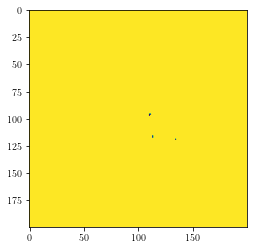

In [10]:
R=100
toshow=w[0,0,100-R:100+R,100-R:100+R]
imshow(toshow)
print(np.max(toshow))
print(np.min(toshow))

In [19]:
pyfits.writeto('asdfsd.fits',sparse3D.alphaR[:,1,:,:]*sparse3D._w[:,1,:,:],overwrite=True)

In [8]:
pyfits.writeto('asdfsd.fits',sparse3D.alphaR[:,1,:,:],overwrite=True)